In [20]:
from math import sqrt

import numpy as np

import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import skimage
from skimage import io, exposure, img_as_float, img_as_ubyte, morphology, filters, util
from skimage.color import rgb2gray, label2rgb
from skimage.feature import canny, blob_dog, blob_log, blob_doh,  peak_local_max
from skimage.filters import sobel, threshold_otsu, try_all_threshold, threshold_local, threshold_minimum
from skimage.segmentation import clear_border, watershed, random_walker
from skimage.measure import label, regionprops
from skimage.measure import label, regionprops
from skimage.color import label2rgb
from skimage.morphology import closing, binary_closing, disk, binary_dilation, remove_small_holes, remove_small_objects
from skimage.io import imsave, imread

import cv2

from scipy import ndimage as ndi
from scipy.stats import norm

import os

import plotly.graph_objs as go

import platform

### Read image

Read image as greyscale and color in parallel

In [2]:
image_filename = '/Users/carolinemccue/Dropbox (MIT)/Fall 2021/CellPics/CHO_092121/CHO_flat_10x'

if os.path.isdir(image_filename):
    img_list = [os.path.join(image_filename,f) for f in os.listdir(image_filename) if f.endswith('.tif')]
elif os.path.isfile(image_filename):
    img_list = [image_filename]

images = []

for image_file in img_list:
        image = cv2.imread(image_file, 0)
        images.append(image)
        

In [3]:
out_directory = "CHO_flat_test"
if not os.path.exists(out_directory):
    os.mkdir(out_directory)

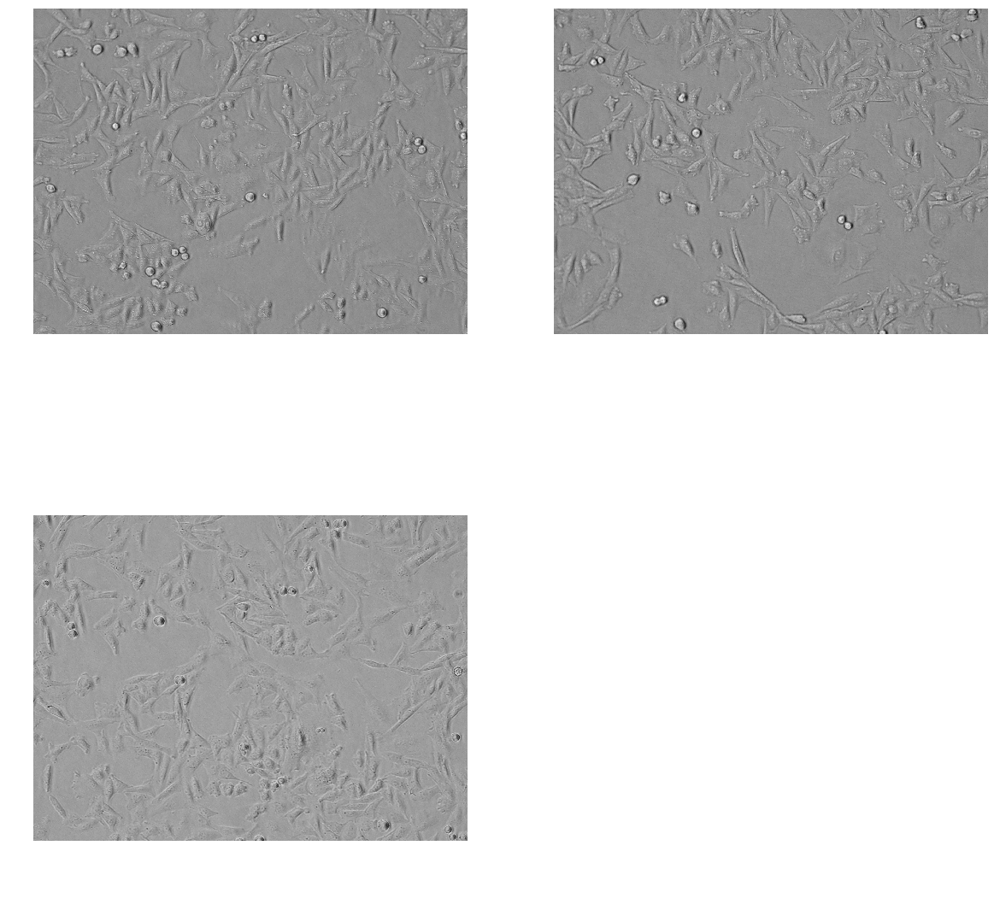

In [6]:
n_col = 2
n_rows = n_rows = (len(img_list)) // n_col + 1

fig, ax = plt.subplots(n_col, n_rows, figsize=(20, 20))
axes = ax.ravel()

for i, image in enumerate(images):
    axes[i].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
    axes[i].axis('off')
    
for i in range(n_col*n_rows - len(img_list)):
    axes[-(i+1)].axis('off')

plt.show()

### Increase contrast

Adaptive equalization can deal with some non-uniformity in the original image

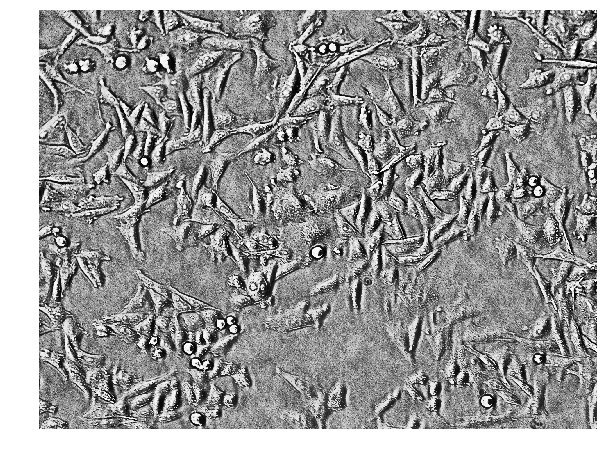

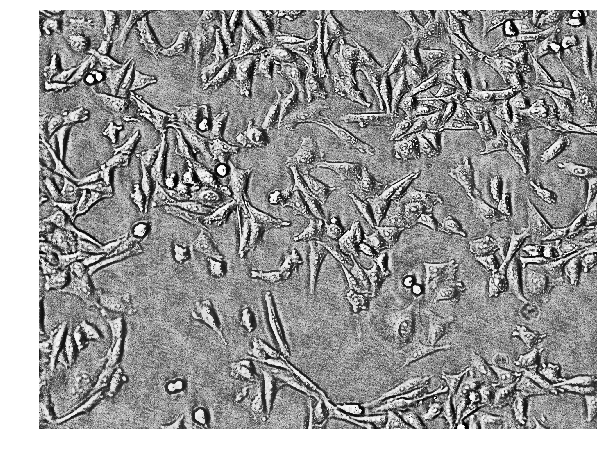

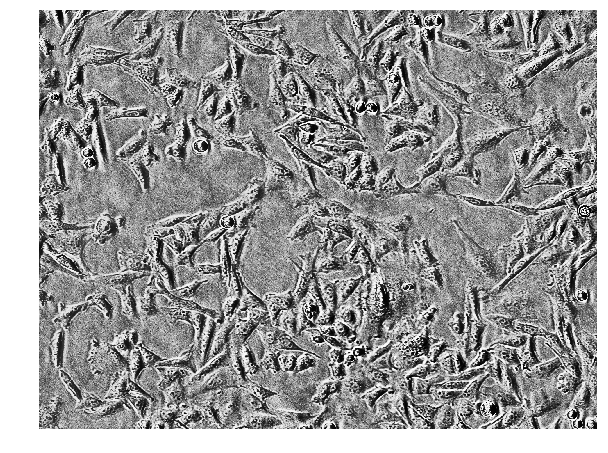

In [32]:
# Adaptive Equalization
clahe = cv2.createCLAHE(clipLimit=15, tileGridSize=(10,10))
img_adapteqs = []

for image in images:
    img_adapteq = clahe.apply(image)
    img_adapteqs.append(img_adapteq)
    
    fig, ax = plt.subplots(figsize=(10,10))
    plt.imshow(img_adapteq, cmap=plt.cm.gray, interpolation='nearest')
    ax.axis('off')

    plt.show()

### Threshold

Otsu threshold was found to work best in this type of image (see SegmentationDropletsInCapillary).

Minimum threshold: 125.0
Min intensity: 0
Max intensity: 255


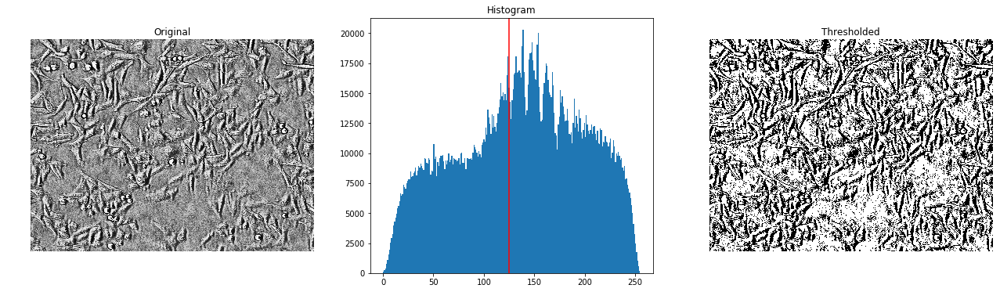

Minimum threshold: 124.0
Min intensity: 0
Max intensity: 255


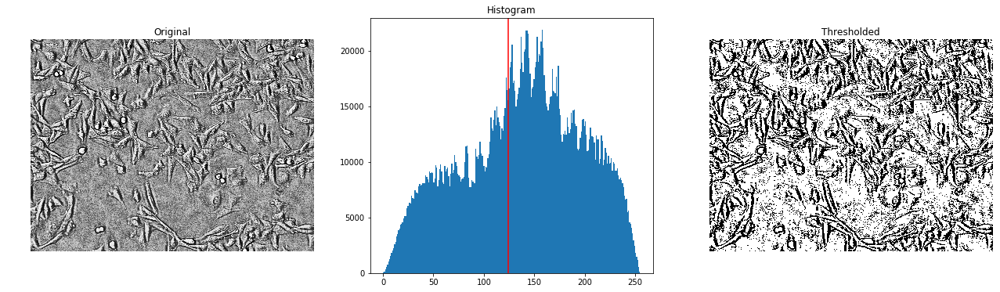

Minimum threshold: 127.0
Min intensity: 0
Max intensity: 255


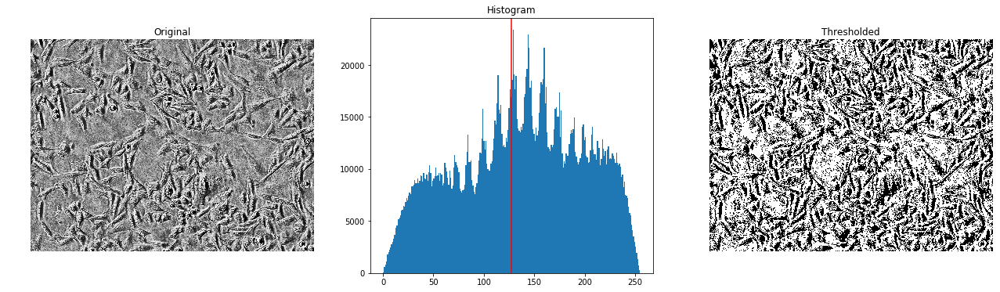

In [23]:
blur = []
retVal = []
binarys = []

for img_adapteq in img_adapteqs:
    blur = cv2.GaussianBlur(img_adapteq,(3,3),0)
    retVal, binary = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    binarys.append(binary)

    fig, axes = plt.subplots(ncols=3, figsize=(22, 6))
    ax = axes.ravel()
    ax[0] = plt.subplot(1, 3, 1)
    ax[1] = plt.subplot(1, 3, 2)
    ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

    ax[0].imshow(img_adapteq, cmap=plt.cm.gray)
    ax[0].set_title('Original')
    ax[0].axis('off')

    ax[1].hist(img_adapteq.ravel(), bins=256)
    ax[1].set_title('Histogram')
    ax[1].axvline(retVal, color='r')

    ax[2].imshow(binary, cmap=plt.cm.gray)
    ax[2].set_title('Thresholded')
    ax[2].axis('off')

    print('Minimum threshold: ' + str(retVal))
    print('Min intensity: ' + str(np.min(img_adapteq)))
    print('Max intensity: ' + str(np.max(img_adapteq)))
    plt.show()

### Perform Watershed segmentation

- Close to remove artifacts from contrast increase and thresholding
- Detect sure foreground and background from thresholding and distance transform
- Run the watershed algorithm to segment
- Label segmented regions

#### Closing and removing small dark spots from crystal borders

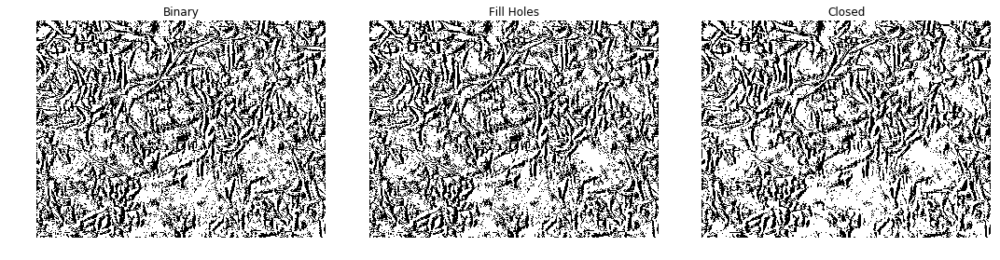

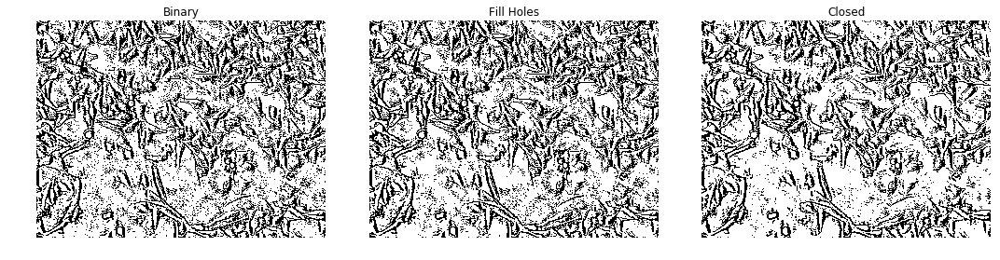

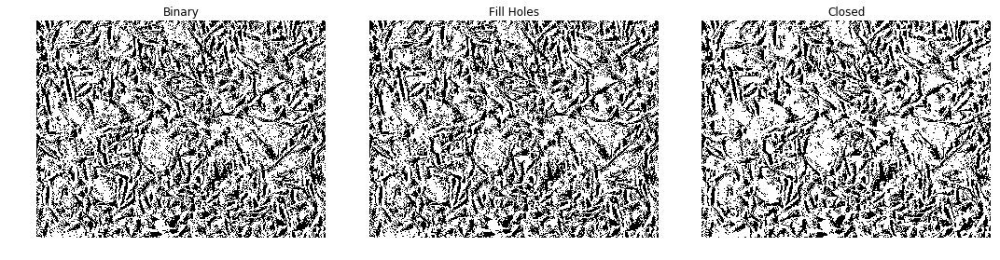

In [35]:
kernels = []
closeds = []
fill_holes = []


for binary in binarys:

    fill_hole = ndi.morphology.binary_fill_holes(binary, structure=np.ones((11,11))).astype('uint8')

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2))
    closed = cv2.morphologyEx(fill_hole, cv2.MORPH_CLOSE, kernel, iterations = 2)
    
    fill_holes.append(fill_hole)
    kernels.append(kernel)
    closeds.append(closed)

    #remove_posts = morphology.remove_small_objects(closed, 50)
    #remove_posts = morphology.remove_small_holes(remove_posts, 50)
    #remove_posts = remove_posts.astype(np.uint8)

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
    ax = axes.ravel()

    ax[0].imshow(binary, cmap=plt.cm.gray, interpolation='nearest')
    ax[0].set_title('Binary')
    ax[1].imshow(fill_hole, cmap=plt.cm.gray, interpolation='nearest')
    ax[1].set_title('Fill Holes')
    ax[2].imshow(closed, cmap=plt.cm.gray, interpolation='nearest')
    ax[2].set_title('Closed')
    #ax[3].imshow(remove_posts, cmap=plt.cm.gray, interpolation='nearest')
    #ax[3].set_title('Remove posts')


    for a in ax:
        a.set_axis_off()

    plt.tight_layout()
    plt.show()


#### Sure foreground / background determination

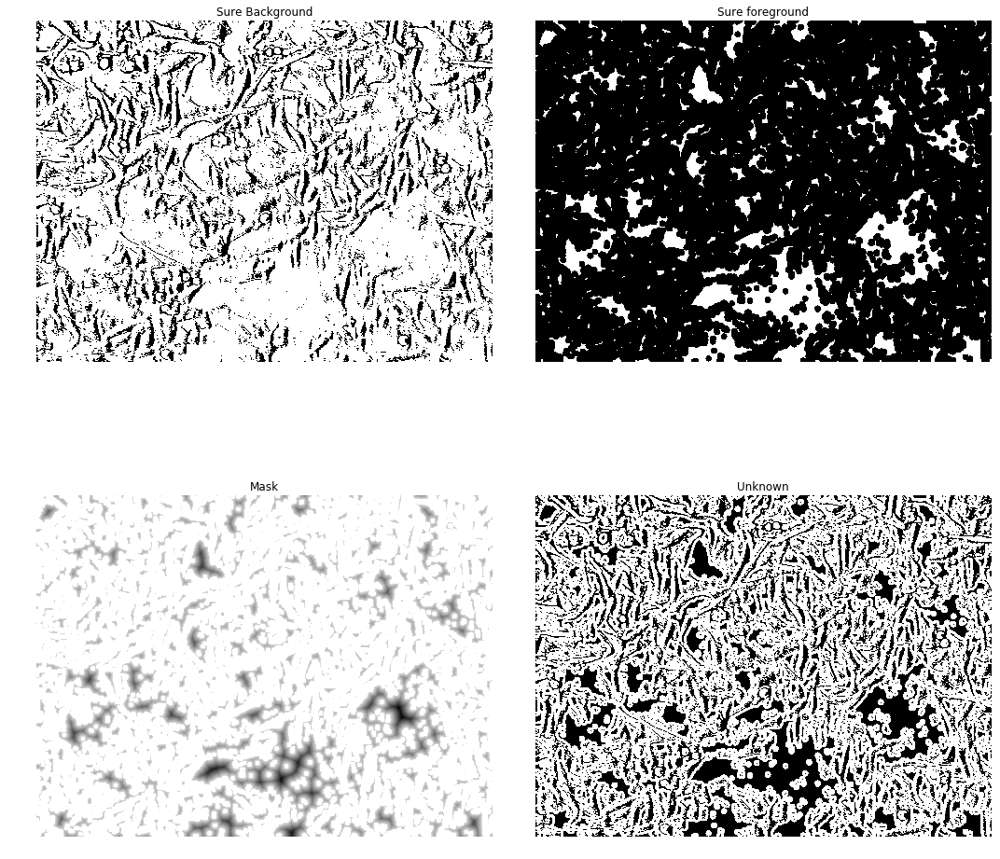

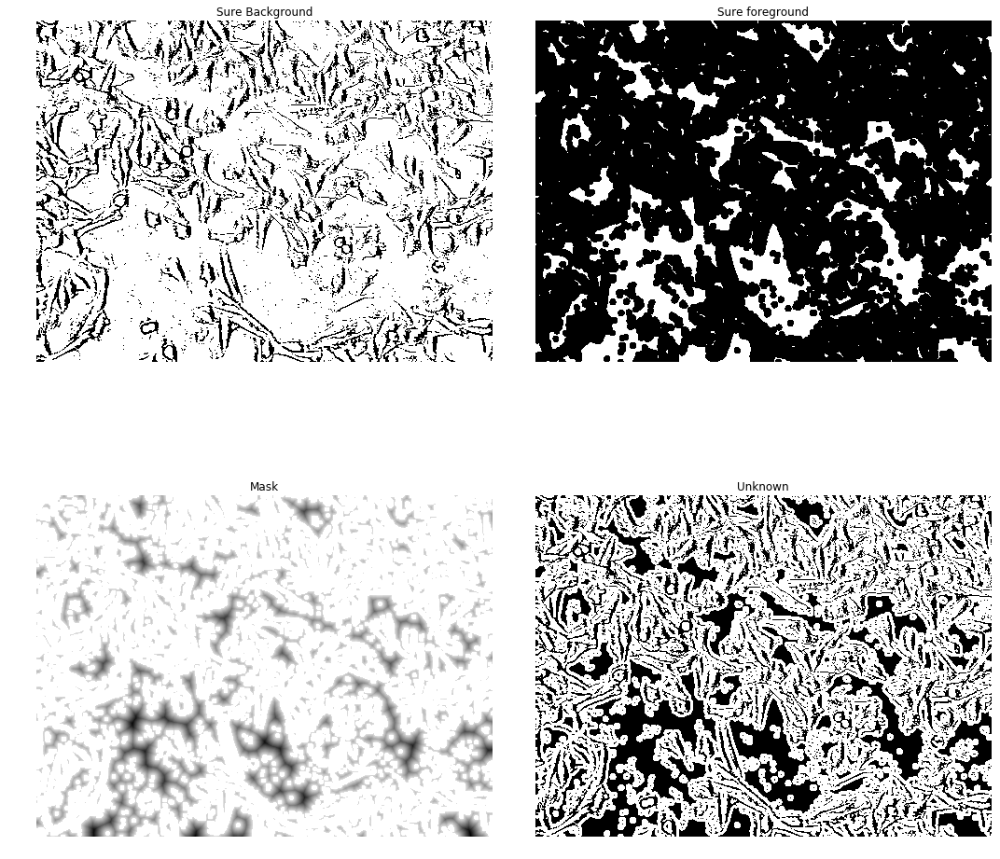

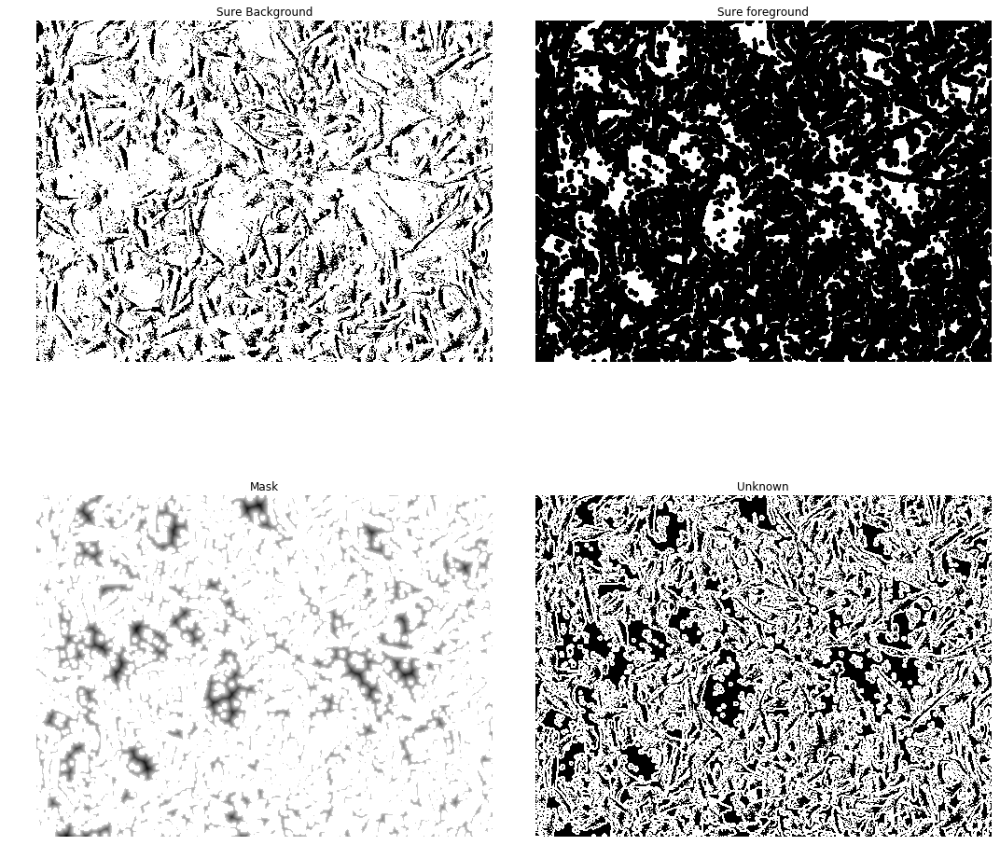

In [36]:
rets = []
sure_fgs = []

for binary in binarys:

    kernel = np.ones((2,2),np.uint8)
    #opening = cv2.morphologyEx(closed,cv2.MORPH_OPEN,kernel, iterations = 2)
    closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations = 3)
    # sure background area
    #sure_bg = cv2.dilate(opening,kernel,iterations=3)
    sure_bg = cv2.dilate(closing,kernel,iterations=2)
    # Finding sure foreground area
    #dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    dist_transform = cv2.distanceTransform(closing,cv2.DIST_L2,5)
    ret, sure_fg = cv2.threshold(dist_transform,0.2*dist_transform.max(),255,0)
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg,sure_fg)

    mask = dist_transform.copy()
    mask[mask < 8] = 0
    
    rets.append(ret)
    sure_fgs.append(sure_fg)

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
    ax = axes.ravel()

    ax[0].imshow(sure_bg, cmap=plt.cm.gray, interpolation='nearest')
    ax[0].set_title('Sure Background')
    ax[1].imshow(sure_fg, cmap=plt.cm.gray, interpolation='nearest')
    ax[1].set_title('Sure foreground')
    ax[2].imshow(-mask, cmap=plt.cm.gray, interpolation='nearest')
    ax[2].set_title('Mask')
    ax[3].imshow(unknown, cmap=plt.cm.gray, interpolation='nearest')
    ax[3].set_title('Unknown')

    for a in ax:
        a.set_axis_off()

    plt.tight_layout()
    plt.show()

#### Label markers

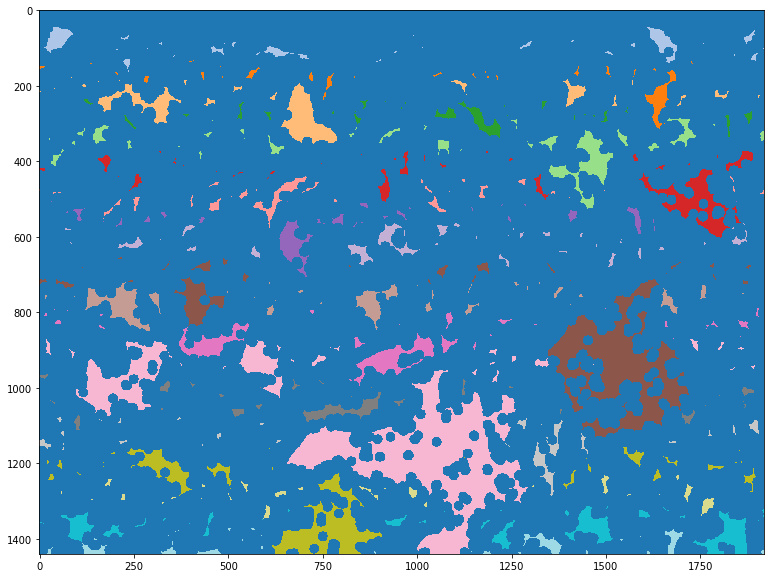

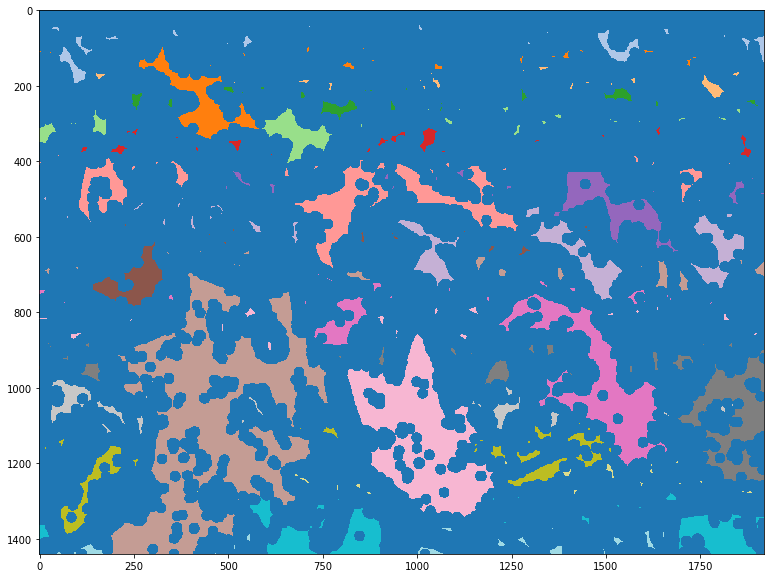

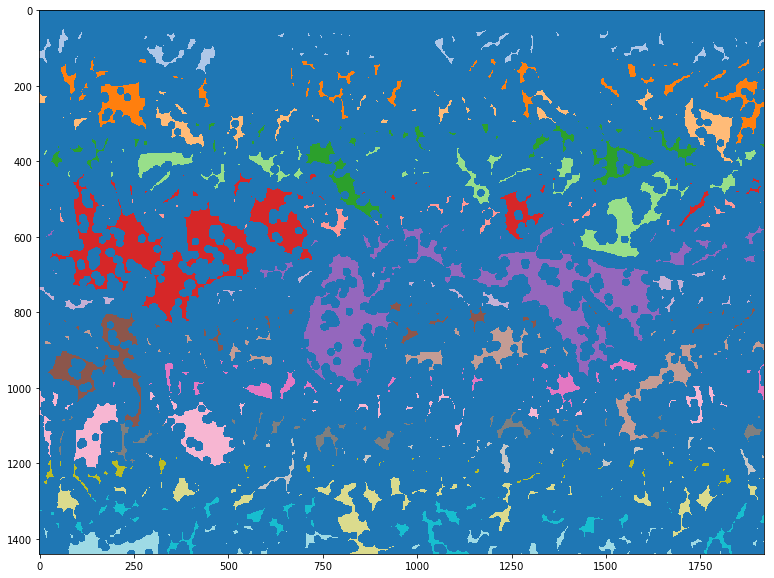

In [38]:
markers = []

for sure_fg in sure_fgs:

    ret, marker = cv2.connectedComponents(sure_fg)
    markers.append(marker)

    fig = plt.figure(figsize=(15,10))
    plt.imshow(marker, cmap=plt.cm.tab20)

#### Run the watershed algorithm

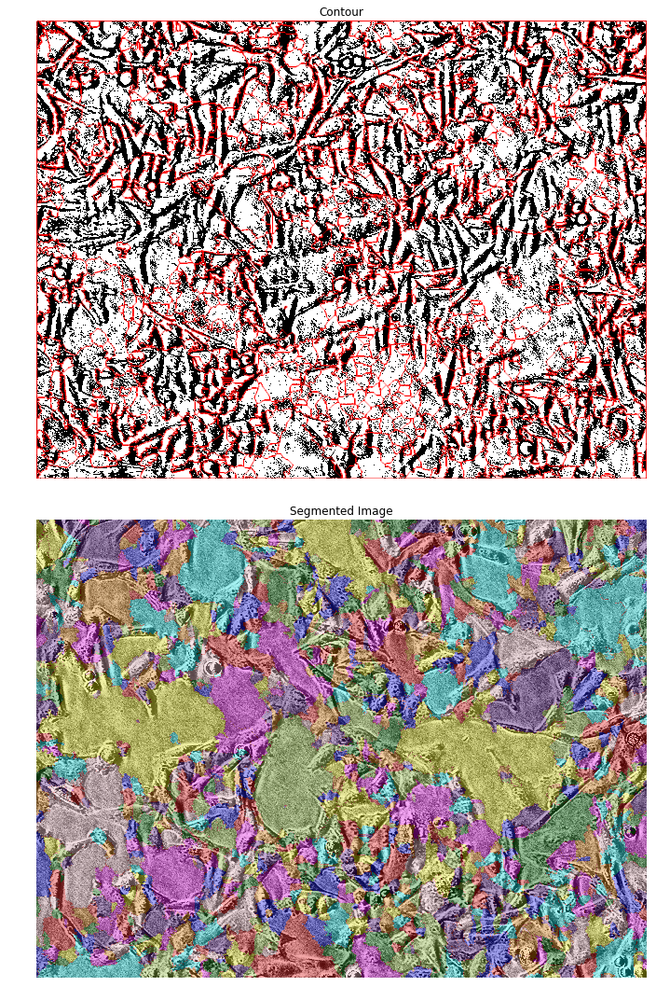

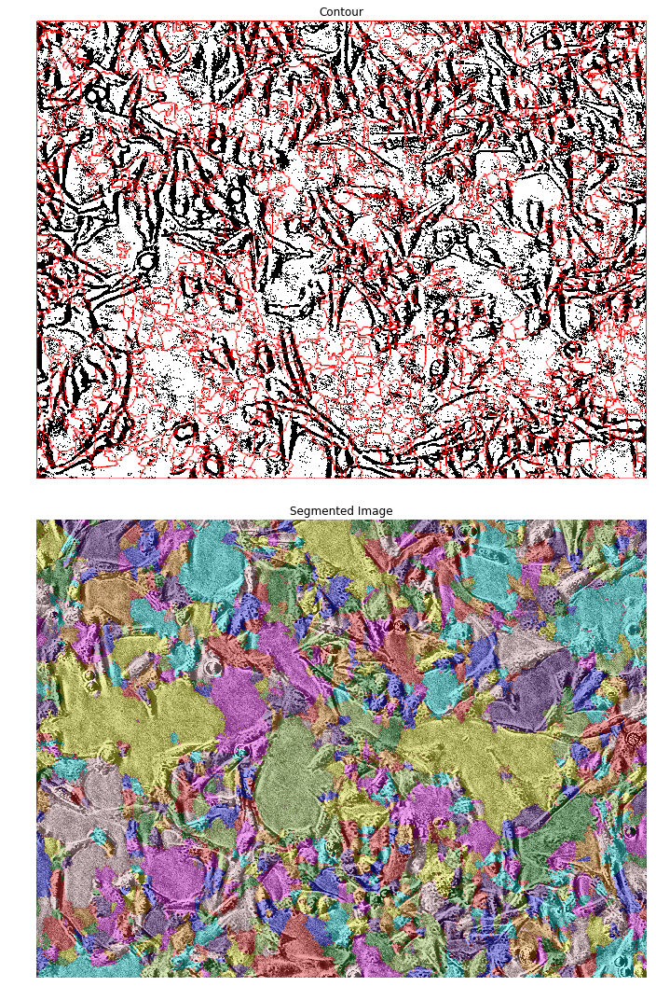

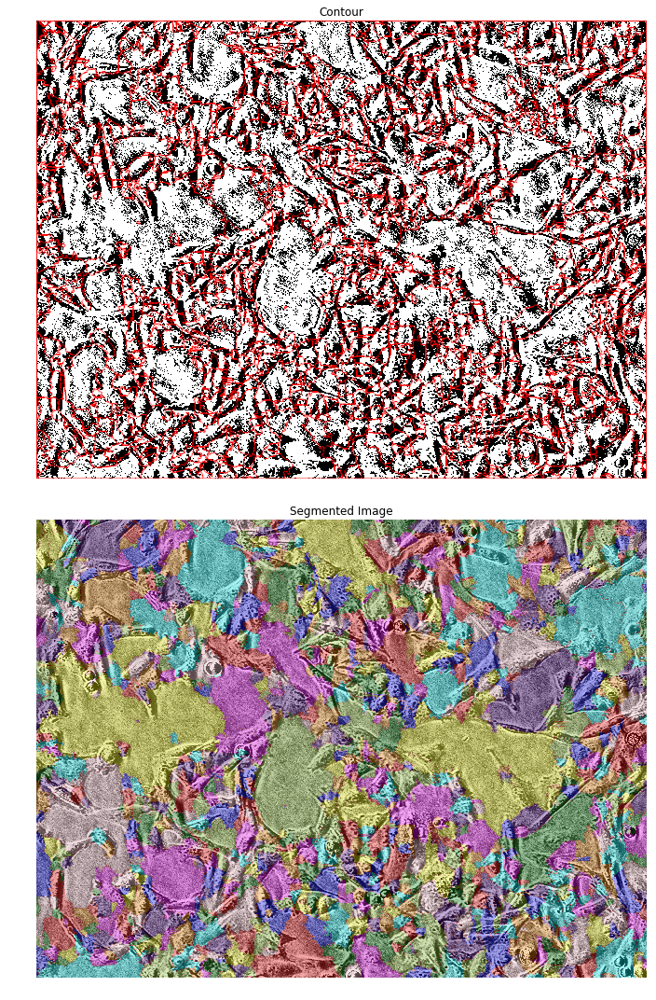

In [40]:
for binary in binarys:
    
    threeChannels = cv2.cvtColor(binary, cv2.COLOR_GRAY2BGR)
    segmented = cv2.watershed(threeChannels.astype('uint8'), marker)

    # Color the labels sections for display
    image_label_overlay = label2rgb(segmented, image=img_adapteq, bg_label=1)

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))
    ax = axes.ravel()

    ax[0].imshow(binary, cmap=plt.cm.gray, interpolation='nearest')
    ax[0].contour(segmented, [0.5], linewidths=1, colors='r')
    ax[0].set_title('Contour')
    ax[1].imshow(image_label_overlay)
    ax[1].set_title('Segmented Image')

    for a in ax:
        a.set_axis_off()


    plt.tight_layout()
    plt.show()

#### Extract the region properties

Note that label 1 is attributed to the background in the code above

In [ ]:
reg = regionprops(segmented, intensity_image=image)[1:]
columns= ['Label', 'Area', 'Eccentricity', 'Circularity', 'Bbox Area', 'Bbox', 'Centroid', 'Image', 'Long Axis', 'Short Axis']
df = pd.DataFrame(columns=columns, dtype=np.float64)
df = df.append([{'Label':i.label, 'Area':i.area, 'Eccentricity':i.eccentricity, 'Circularity':(4 * np.pi * i.area / (i.perimeter**2)), 'Bbox Area':i.bbox_area, 'Bbox':i.bbox, 'Centroid':i.centroid, 'Image':i.intensity_image, 'Long Axis':i.major_axis_length, 'Short Axis':i.minor_axis_length} for i in reg])
df.head(5)

In [ ]:
reg = [region for region in reg if (region.area) > 250 and (region.area) < 25000]

#### Display labeled region bounding boxes and labels

In [ ]:
boxed_regions = image.copy()

# Iterate over all non-background labels
for region in reg:
    (min_row, min_col, max_row, max_col) = region.bbox
    color = np.uint8(np.random.randint(0, 255, 3)).tolist()
    cv2.rectangle(boxed_regions, (min_col,min_row), (max_col,max_row), color, 3)
    cv2.putText(boxed_regions,'%d'%region.label,(min_col+50, min_row+100), cv2.FONT_HERSHEY_SIMPLEX, 3, color, 3, cv2.LINE_AA)
    
fig = plt.figure(figsize=(15,10))
plt.imshow(boxed_regions, cmap=plt.cm.gray)

In [ ]:
df['Area'].plot()
df['Area'].median(), df['Area'].mean(), df['Area'].mean()

In [ ]:
# Display parameters
org_img = image # Intensity image
border = 25 # Additional pixels to display on each side of the bounding box
ecc_cutoff = 0.05 # circularity cuttoff, removes background circles
ecc_cutoff_upper = 1
area_cutoff_upper = 2*df.Area.mean() # Area cuttoff, removes misidentified shapes (for instance half-droplets)
area_cutoff_lower = 1.25*df.Area.median()
max_col = org_img.shape[1]
max_row = org_img.shape[0]

n_img = len(reg)
print("{} cells were detected and segmented".format(n_img))
n_col = 50
n_rows = n_img // n_col + 1

reg.sort(key=lambda x: x.area)
reg_clean = [region for region in reg if (region.area) > area_cutoff_lower and (region.area) < area_cutoff_upper and region.eccentricity > ecc_cutoff and region.eccentricity < ecc_cutoff_upper]

print("{} cells with selected criteria".format(len(reg_clean), area_cutoff_lower, area_cutoff_upper))

fig, ax = plt.subplots(n_col, n_rows)
axes = ax.ravel()

for i, region in enumerate(reg_clean):
    (min_row, min_col, max_row, max_col) = region.bbox
    drop_image = org_img[np.max([min_row-border,0]):np.min([max_row+border,max_row]),np.max([min_col-border,0]):np.min([max_col+border,max_col])]
    contrast_stretch = exposure.rescale_intensity(drop_image, in_range=(0,255))
    name = os.path.join(out_directory, os.path.basename(image_file).split('.')[0] + '_cell_' + str(i) + '.jpg')
    imsave(name, contrast_stretch, check_contrast=False)
    axes[i].imshow(contrast_stretch, cmap=plt.cm.gray, interpolation='nearest', vmin=0, vmax=255)
    axes[i].axis('off')
    
for i in range(n_col*n_rows - len(reg_clean)):
    axes[-(i+1)].axis('off')
    
fig.set_size_inches(15, 50)


In [ ]:
boxed_regions = image.copy()
for region in reg_clean:
    (min_row, min_col, max_row, max_col) = region.bbox
    color = np.uint8(np.random.randint(0, 255, 3)).tolist()
    cv2.rectangle(boxed_regions, (min_col,min_row), (max_col,max_row), color, 3)
    cv2.putText(boxed_regions,'%d'%region.label,(min_col+50, min_row+100), cv2.FONT_HERSHEY_SIMPLEX, 3, color, 3, cv2.LINE_AA)
    
fig = plt.figure(figsize=(15,10))
plt.imshow(boxed_regions, cmap=plt.cm.gray)

In [ ]:
columns= ['Label', 'Area', 'Eccentricity', 'Circularity', 'Bbox Area', 'Bbox', 'Centroid', 'Image', 'Long Axis', 'Short Axis']
df2 = pd.DataFrame(columns=columns, dtype=np.float64)
df2 = df2.append([{'Label':i.label, 'Area':i.area, 'Eccentricity':i.eccentricity, 'Circularity':(4 * np.pi * i.area / (i.perimeter**2)), 'Bbox Area':i.bbox_area, 'Bbox':i.bbox, 'Centroid':i.centroid, 'Image':i.intensity_image, 'Long Axis':i.major_axis_length, 'Short Axis':i.minor_axis_length} for i in reg_clean])
df2.tail(5)

In [ ]:
areaumflat = df2['Area'] * 0.369 ** 2
areaumflat.mean(), areaumflat.std()

In [ ]:
num_bins = 30
mu = areaumflat.mean()
std = areaumflat.std()
fig, ax = plt.subplots()
plt.hist(areaumflat, num_bins, density = 1)

mu, std = norm.fit(areaumflat)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)

plt.plot(x, p, '--', color = 'black')
plt.xlabel("Cell Area ($\mu m^2$)")
plt.ylabel("Probability Density")
plt.title("Cell Area Distribution (Flat)")
plt.show ()

In [ ]:
spreading_factorflat = 1 - (df2['Short Axis'] / df2['Long Axis'])

num_bins = 30
muS = spreading_factorflat.mean()
stdS = spreading_factorflat.std()
fig, ax = plt.subplots()
plt.hist(spreading_factorflat, num_bins, density = 1)

muS, stdS = norm.fit(spreading_factorflat)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, muS, stdS)

plt.plot(x, p, '--', color = 'black')
plt.xlabel("Spreading Factor")
plt.ylabel("Probability Density")
plt.title("Cell Spreading (Flat)")
plt.show ()

In [ ]:
circularityflat=df2['Circularity']

num_bins = 30
muC = circularityflat.mean()
stdC = circularityflat.std()
fig, ax = plt.subplots()
plt.hist(circularityflat, num_bins, density = 1)

muC, stdC = norm.fit(circularityflat)
xmin, xmax = plt.xlim()
xC = np.linspace(xmin, xmax, 100)
pC = norm.pdf(xC, muC, stdC)

plt.plot(xC, pC, '--', color = 'black')
plt.xlabel("Circularity Factor")
plt.ylabel("Probability Density")
plt.title("Cell Circularity (Flat)")
plt.show ()

In [ ]:
celllengthflat= df2['Long Axis'] * 0.369
cellwidthflat = df2['Short Axis'] * 0.369

In [ ]:
%store areaumflat
%store spreading_factorflat
%store circularityflat
%store celllengthflat
%store cellwidthflat

In [ ]:
import pickle

img_list = []
area_list = []
for region in reg_clean:
        area_list = df['Area'].tolist()
        cellarea = {img_list[i] : area_list[i] for i in range(len(img_list))}
        
with open(os.path.join(out_directory, os.path.basename(image_file).split('.')[0] + '.pkl'), 'wb') as f:
    f.write(pickle.dumps(cellarea))